In [6]:
%%capture
#!pip install pandas-profiling;
!pip install wordcloud
!pip install squarify
!pip install pywaffle

In [5]:
#!pip uninstall pandas-profiling
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=791695165135ca2968666bcf24668aa0c0ab1a01e0402dd1ed76ec9486fea148
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [7]:
from collections import defaultdict, Counter
from functools import partial
import json
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import os
import pickle
import pandas as pd
from ydata_profiling import ProfileReport
from pywaffle import Waffle
import squarify
import scipy
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics.pairwise import linear_kernel, cosine_similarity
from wordcloud import WordCloud

pd.set_option("display.max_columns", None)
%matplotlib inline

In [8]:
PATH = "/kaggle/input/tmdb-movie-metadata"
print(os.listdir(PATH))

['tmdb_5000_movies.csv', 'tmdb_5000_credits.csv']


In [9]:
credit=pd.read_csv(os.path.join(PATH,'tmdb_5000_credits.csv'))
movie=pd.read_csv(os.path.join(PATH,'tmdb_5000_movies.csv'))



In [10]:
credit.head(1)

,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."


In [11]:
movie.head(1)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800


In [12]:
credit.columns=['id','tittle','cast','crew']
movie_df=movie.merge(credit,on='id')

del movie
del credit

In [13]:
movie_df.head(1)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,tittle,cast,crew
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."


In [14]:
report=ProfileReport(movie_df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 23/23 [00:20<00:00,  1.13it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
movie_df["release_date"]=pd.to_datetime(movie_df['release_date'])
movie_df['release_year'] = movie_df['release_date'].dt.year
movie_df['release_month'] = movie_df['release_date'].dt.month_name()
del movie_df["release_date"]

In [16]:
json_columns = {'cast', 'crew', 'genres', 'keywords', 'production_countries',
                'production_companies', 'spoken_languages'}

for c in json_columns:
    movie_df[c]=movie_df[c].apply(json.loads)

    if c !="crew":
        movie_df[c]=movie_df[c].apply(lambda row :[x["name"] for x in row])

In [17]:
def get_job(job,row):

    person_name=[x['name'] for x in row if x['job']==job]
    return person_name[0] if len(person_name) else np.nan

movie_df['director']=movie_df['crew'].apply(partial(get_job,'Director'))
movie_df["writer"]   = movie_df["crew"].apply(partial(get_job, "Writer"))
movie_df["producer"] = movie_df["crew"].apply(partial(get_job, "Producer"))
del movie_df["crew"]

# create profit column
movie_df["profit"] = movie_df["revenue"] - movie_df["budget"]

In [18]:
for col in ['runtime','release_year','release_month']:

    movie_df[col]=movie_df[col].fillna(movie_df[col].mode().iloc[0])

In [19]:
movie_df.head(2)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,tittle,cast,release_year,release_month,director,writer,producer,profit
0,237000000,"[Action, Adventure, Fantasy, Science Fiction]",http://www.avatarmovie.com/,19995,"[culture clash, future, space war, space colon...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[Ingenious Film Partners, Twentieth Century Fo...","[United States of America, United Kingdom]",2787965087,162.0,"[English, Español]",Released,Enter the World of Pandora.,Avatar,7.2,11800,Avatar,"[Sam Worthington, Zoe Saldana, Sigourney Weave...",2009.0,December,James Cameron,James Cameron,James Cameron,2550965087
1,300000000,"[Adventure, Fantasy, Action]",http://disney.go.com/disneypictures/pirates/,285,"[ocean, drug abuse, exotic island, east india ...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[Walt Disney Pictures, Jerry Bruckheimer Films...",[United States of America],961000000,169.0,[English],Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,Pirates of the Caribbean: At World's End,"[Johnny Depp, Orlando Bloom, Keira Knightley, ...",2007.0,May,Gore Verbinski,NaN,Jerry Bruckheimer,661000000


/tmp/ipython-input-20-77135906.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('viridis', top_movie_num)


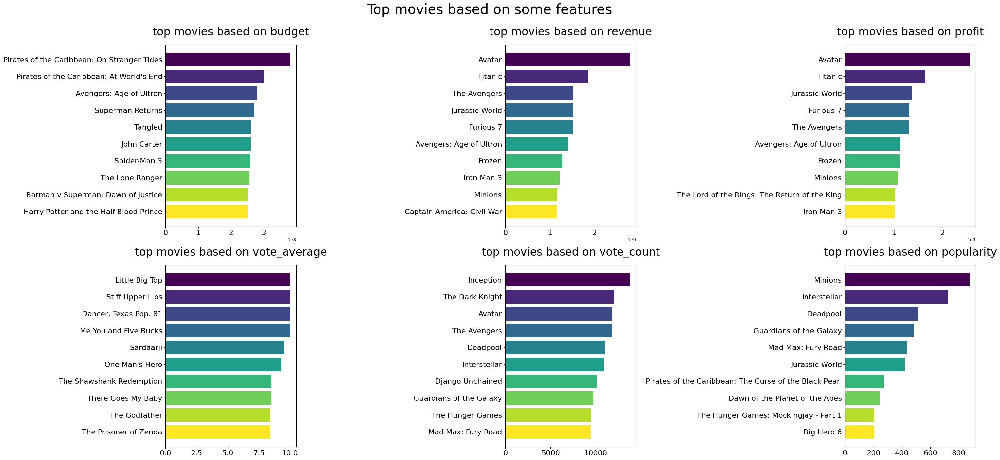

In [20]:
top_movie_num = 10
top_movies_based_on = ["budget", "revenue", "profit", "vote_average", "vote_count", "popularity"]

fig, ax = plt.subplots(len(top_movies_based_on)//3, 3, figsize=(30,14))
colors = plt.cm.get_cmap('viridis', top_movie_num)

for i, col in enumerate(top_movies_based_on):
    top_movies_by = movie_df.sort_values(by=[col], ascending=False).head(top_movie_num)
    r, c = i//3, i%3
    ax[r][c].barh(top_movies_by["title"], top_movies_by[col], color=colors.colors)
    ax[r][c].set_title(f"top movies based on {col}", fontsize=24, pad=20)
    ax[r][c].tick_params(axis='both', which='major', labelsize=16)
    ax[r][c].invert_yaxis()

plt.suptitle('Top movies based on some features',fontsize=30, y=1)
fig.tight_layout()

(np.float64(0.0), np.float64(100.0), np.float64(0.0), np.float64(100.0))

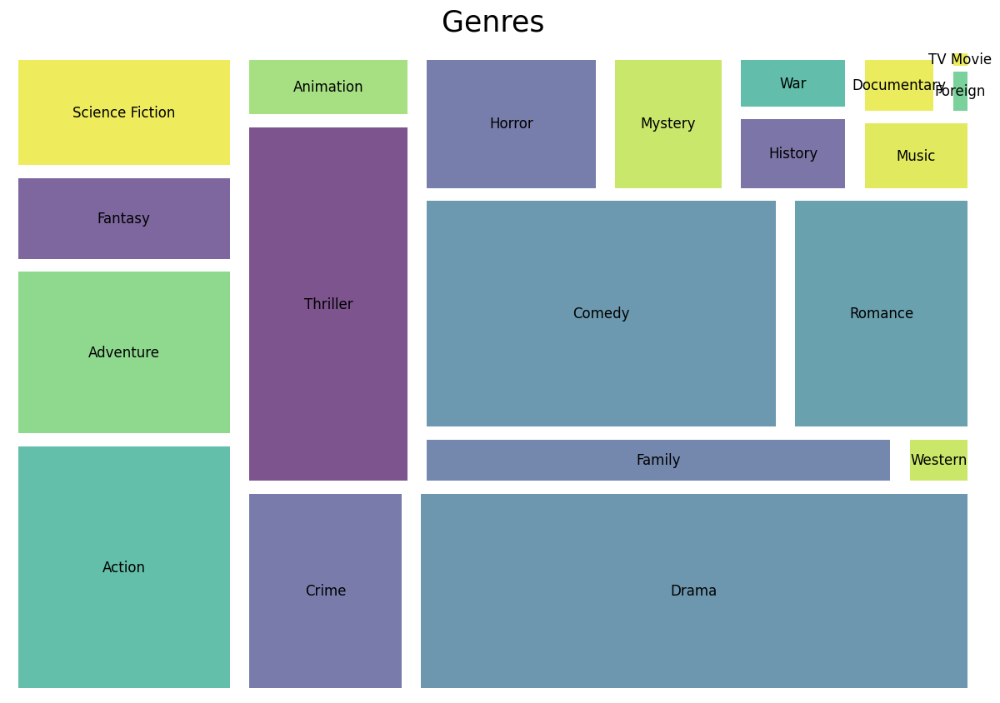

In [21]:
genres_flatten=sum(movie_df['genres'].values,[])
genres_info=Counter(genres_flatten)

plt.figure(figsize=(15,10))
plt.title('Genres',fontsize=25,pad=20)
squarify.plot(genres_info.values(),label=genres_info.keys(),text_kwargs={'fontsize':12},bar_kwargs={'alpha':.7},pad=True)
plt.axis('off')

/tmp/ipython-input-22-1310812442.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.bar(top_keywords.keys(), top_keywords.values(), align='center', color=plt.cm.get_cmap('plasma', top_keywords_num).colors)


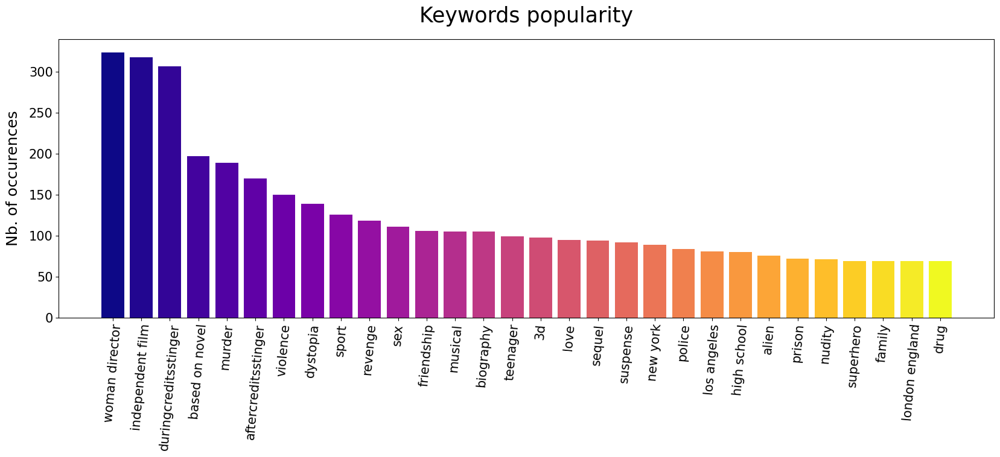

In [22]:
top_keywords_num = 30
keywords_flatten = sum(movie_df["keywords"].values, []) # keywords are list of lists
keywords_info = Counter(keywords_flatten)
top_keywords = dict(keywords_info.most_common(top_keywords_num))

plt.figure(figsize=(20, 6))
plt.xticks(rotation=85, fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Nb. of occurences", fontsize=18, labelpad=10)
plt.bar(top_keywords.keys(), top_keywords.values(), align='center', color=plt.cm.get_cmap('plasma', top_keywords_num).colors)
plt.title("Keywords popularity", fontsize=25, pad=20)
plt.show()

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

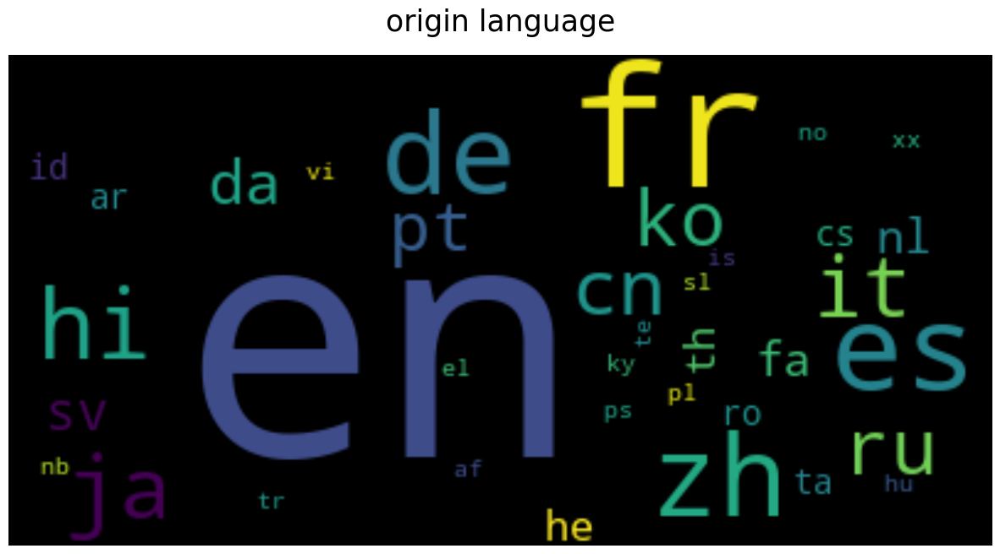

In [23]:
language_info=movie_df['original_language'].value_counts()[:50]

wordcloud=WordCloud(background_color='black')
wordcloud.generate_from_frequencies(dict(language_info))

plt.figure(figsize=(15,10))
plt.title('origin language',fontsize=25,pad=20)
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')

/tmp/ipython-input-24-1244939930.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plt.bar(dict(top_production_contries).keys(), dict(top_production_contries).values(), color=plt.cm.get_cmap('cividis', top_contries_num).colors);


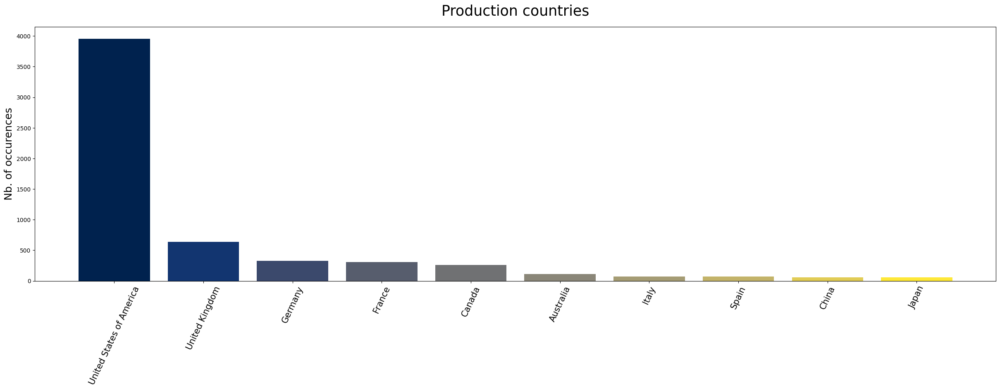

In [24]:
top_contries_num = 10
production_contries_flatten = sum(movie_df["production_countries"].values, []) # production_countries are list of lists
production_contries_info = Counter(production_contries_flatten)
top_production_contries = production_contries_info.most_common(top_contries_num)

plt.figure(figsize=(30, 8))
plt.xticks(rotation=65, fontsize=15)
plt.ylabel("Nb. of occurences", fontsize=18)
plt.title("Production countries", fontsize=25, pad=20)
plt.bar(dict(top_production_contries).keys(), dict(top_production_contries).values(), color=plt.cm.get_cmap('cividis', top_contries_num).colors);

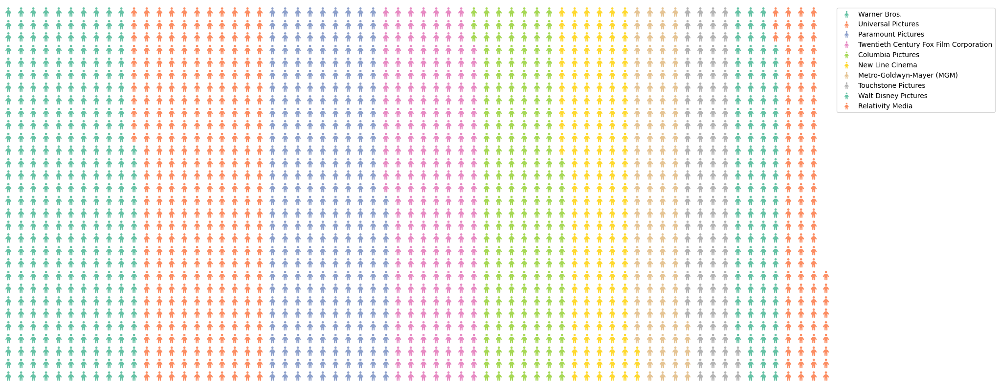

In [25]:
production_companies_flatten=sum(movie_df['production_companies'].values,[])

production_companies_info=Counter(production_companies_flatten)
top_production_companies=production_companies_info.most_common(10)

fig = plt.figure(
    FigureClass=Waffle,
    rows=30,
    values=dict(top_production_companies),
    legend={'loc': 'upper left', 'bbox_to_anchor': (1, 1)},
    icons='child', icon_size=14,
    icon_legend=True,
    figsize=(24,8)
)

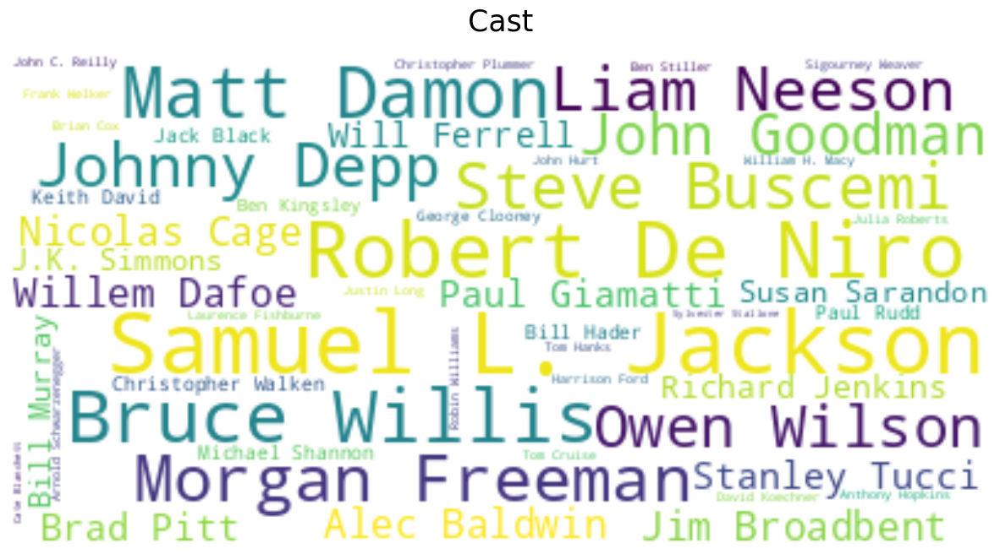

In [26]:
cast_flatten = sum(movie_df["cast"].values, []) # cast are list of lists
cast_info = Counter(cast_flatten)

wordcloud = WordCloud(background_color='white')
wordcloud.generate_from_frequencies(dict(cast_info.most_common(50)))

plt.figure(figsize=(15,10))
plt.title("Cast", fontsize=25, pad=20)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off");

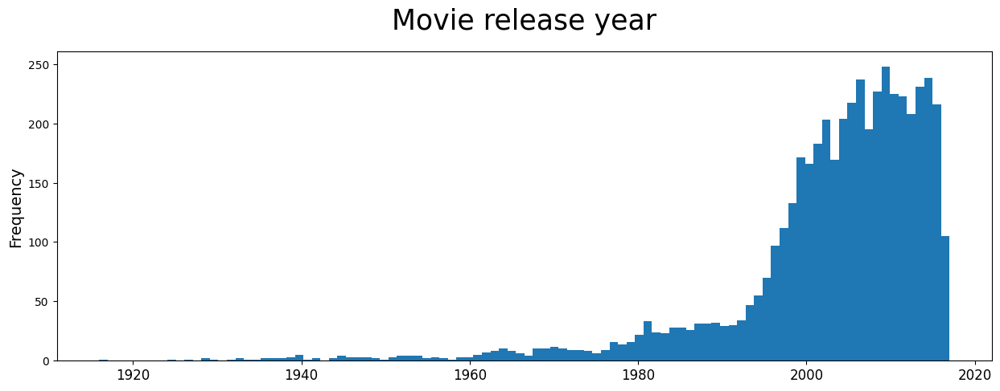

In [27]:
plt.xticks(fontsize=12)
plt.ylabel("Nb. of occurences", fontsize=14)
plt.title("Movie release year", fontsize=25, pad=20)
movie_df["release_year"].plot.hist(figsize=(15,5), bins=100);

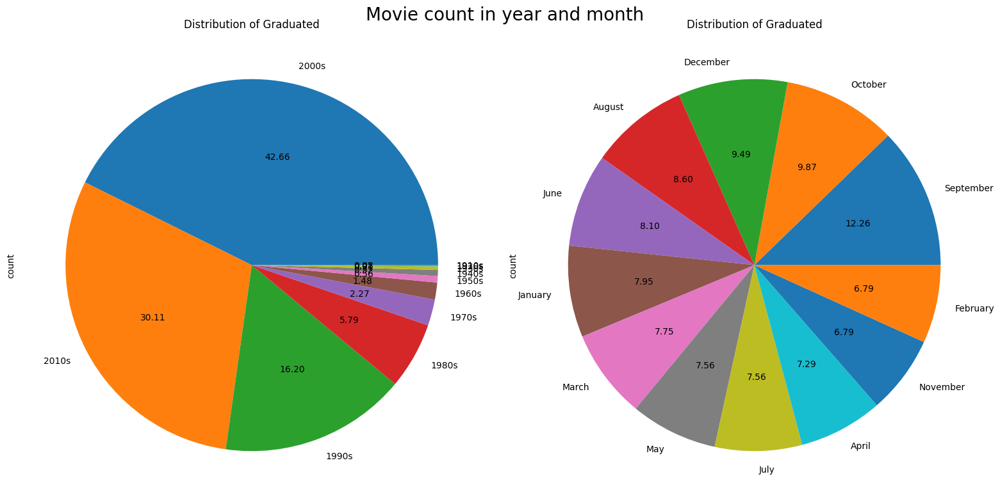

In [28]:
fig,ax =plt.subplots(1,2,figsize=(16,8))
fig.suptitle('Movie count in year and month',fontsize=20)
movie_count_in_10th_year = movie_df["release_year"].dropna().apply(lambda x:str(int(x)//10*10)+'s').value_counts()
movie_count_in_month = movie_df["release_month"].value_counts()

movie_count_in_10th_year.plot.pie(title='Distribution of Graduated', ax=ax[0], autopct="%.2f")
movie_count_in_month.plot.pie(title='Distribution of Graduated', ax=ax[1], autopct="%.2f")
fig.tight_layout()

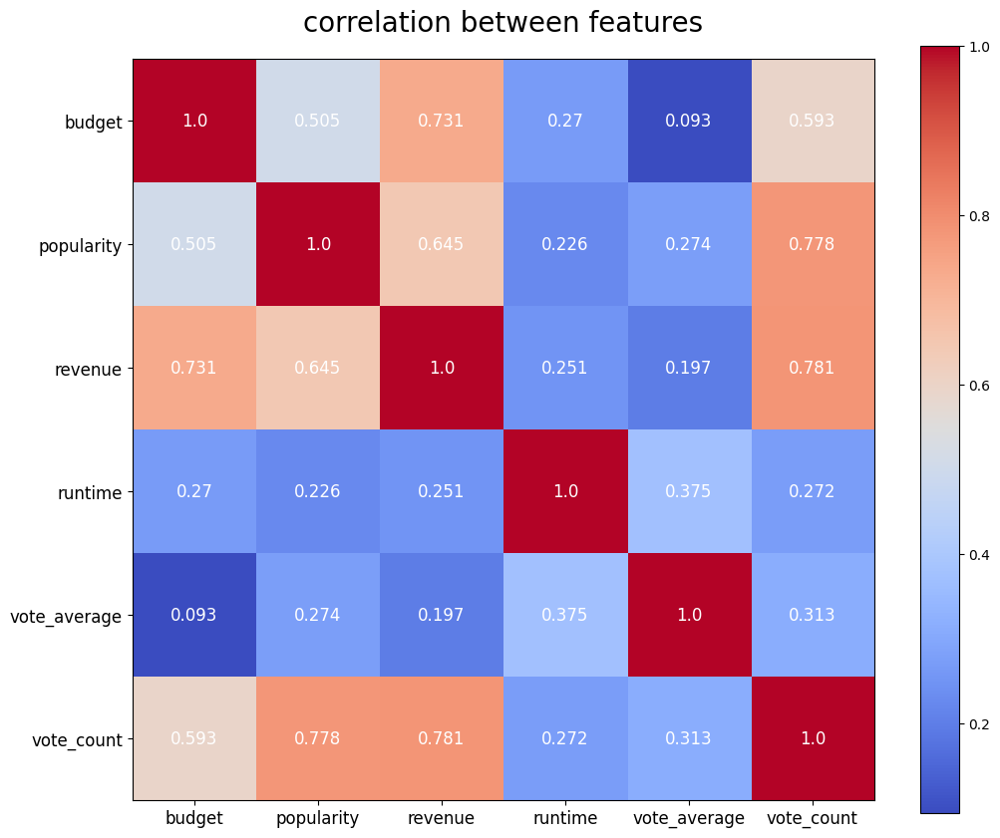

In [29]:
matrix = movie_df[["budget", "popularity", "revenue", "runtime", "vote_average", "vote_count"]].corr()

f, ax = plt.subplots(figsize=(12, 10))
plt.title("correlation between features", fontsize=20, pad=20)
plt.xticks(range(len(matrix.index)), matrix.index, fontsize=12)
plt.yticks(range(len(matrix.index)), matrix.index, fontsize=12)

# adding values
for i in range(len(matrix.index)):
    for j in range(len(matrix.index)):
        text = ax.text(j, i, round(matrix.iloc[i, j],3), ha="center", va="center", color="w", fontsize=12)

plt.imshow(matrix, cmap='coolwarm', interpolation='nearest')
plt.colorbar();

In [30]:
C=movie_df['vote_average'].mean()
m=movie_df['vote_count'].quantile(0.9)
q_movies=movie_df.copy().loc[movie_df['vote_count']>=m]
C,m,q_movies.shape

(np.float64(6.092171559442016), np.float64(1838.4000000000015), (481, 27))

In [31]:
def weighted_rating(x, m=m, C=C):
    v = x['vote_count']
    R = x['vote_average']
    return (v/(v+m) * R) + (m/(m+v) * C)

q_movies['score'] = q_movies.apply(weighted_rating, axis=1)
q_movies = q_movies.sort_values('score', ascending=False)
q_movies[['title', 'vote_count', 'vote_average', 'score']].head(5)

,title,vote_count,vote_average,score
1881,The Shawshank Redemption,8205,8.5,8.059258
662,Fight Club,9413,8.3,7.939256
65,The Dark Knight,12002,8.2,7.920020
3232,Pulp Fiction,8428,8.3,7.904645
96,Inception,13752,8.1,7.863239


In [32]:
movie_df['overview'].head(3)

,overview
0,"In the 22nd century, a paraplegic Marine is di..."
1,"Captain Barbossa, long believed to be dead, ha..."
2,A cryptic message from Bond’s past sends him o...


In [33]:
movie_df['overview']=movie_df['overview'].fillna('')

tfidf=TfidfVectorizer(stop_words='english')
tfidf_matrix=tfidf.fit_transform(movie_df['overview'])
cosine_sim=linear_kernel(tfidf_matrix,tfidf_matrix)
indices=pd.Series(movie_df.index,index=movie_df['title']).drop_duplicates()
tfidf_matrix.shape

(4803, 20978)

In [52]:
def get_recommendations(title, cosine_sim=cosine_sim):
    if title not in indices:
        return f"Movie title '{title}' not found in the database."

    idx = indices[title]
    if isinstance(idx, pd.Series):
        idx = idx.iloc[0] # Take the first index if there are duplicates

    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:6]
    movie_indices = [i[0] for i in sim_scores]
    movie_similarity = [i[1] for i in sim_scores]

    return pd.DataFrame(zip(movie_df['title'].iloc[movie_indices], movie_similarity), columns=["title", "similarity"])

In [35]:
get_recommendations('The Godfather: Part II')

,title,similarity
0,The Godfather,0.412329
1,The Godfather: Part III,0.259649
2,An American in Hollywood,0.121267
3,A Most Violent Year,0.111731
4,Casino,0.110821


In [36]:
get_recommendations('The Avengers')

,title,similarity
0,Avengers: Age of Ultron,0.146374
1,Plastic,0.122791
2,Timecop,0.110385
3,This Thing of Ours,0.107529
4,Thank You for Smoking,0.106203


In [37]:
features=['cast','keywords','genres']
top_num=5
for feature in features:
    movie_df[feature]=movie_df[feature].apply(lambda x : x[:top_num] if isinstance(x,list) else [])

In [38]:
def clean_data(x):

    if isinstance(x,list):
        return [str.lower(i.replace(' ','')) for i in x]

    elif isinstance(x,str):
        return str.lower(x.replace(' ',''))

    else:
        return ''

features = ['cast', 'keywords', 'genres', 'director', "writer", "producer", "production_companies", "production_countries"]

for feature in features:
    movie_df[feature] = movie_df[feature].apply(clean_data)

In [39]:
def create_joined_features(x):
    return ' '.join([' '.join(x[f]) if isinstance(x[f], list) else str(x[f]) for f in features])

movie_df["join_features"] = movie_df.apply(create_joined_features, axis=1)

In [40]:
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(movie_df['join_features'])
cosine_sim2 = cosine_similarity(count_matrix, count_matrix)
movie_df = movie_df.reset_index()
indices = pd.Series(movie_df.index, index=movie_df['title'])

count_matrix.shape

(4803, 24176)

In [41]:
get_recommendations('The Godfather: Part II', cosine_sim2)

,title,similarity
0,The Godfather: Part III,0.559503
1,The Conversation,0.487950
2,The Godfather,0.410391
3,Apocalypse Now,0.350000
4,The Rainmaker,0.316228


In [55]:
get_recommendations('spider-man3', cosine_sim2)

"Movie title 'spider-man3' not found in the database."

In [58]:
import joblib  # or pickle
joblib.dump(movie_df, 'netflix_model.pkl')


['netflix_model.pkl']

In [60]:
movie_df.to_csv('processed_data.csv', index=False)

In [61]:
from google.colab import files
files.download('netflix_model.pkl')
files.download('processed_data.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>